<a href="https://colab.research.google.com/github/baohien97/EPFL-ANN-Miniproject/blob/master/HienVersion_miniproject_ff_template.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Miniproject |  Training and Visualisation of Feedforward Neural Networks

## Introduction

### Description

In this project we will investigate deep neural networks to solve the task of letter and digit classification and visualise the features they learend. We will use the 'balanced' version the [EMNIST dataset](https://www.nist.gov/itl/products-and-services/emnist-dataset) containing 28x28-pixel grayscale images of handwritten digits and letters in 47 mutually exclusive classes. More details can be found in this [paper](https://arxiv.org/pdf/1702.05373v1.pdf). The dataset is an drop-in extension of the famous [MNIST dataset](http://yann.lecun.com/exdb/mnist/) of handwritten digits that was and still is commonly used as a first test or 'sanity check' for new classification algorithms.  

**The first part** of the project will introduce you to some basics of image classification using deep feedforward neural networks. 
**The second part** of the project uses standard and not-so-standard ways [1] of visualising learned features in deep neural networks. The results can be quite esthetically appealing, for example visualising the preferred input of hidden units deep inside the [Residual Network](https://arxiv.org/abs/1512.03385) [ResNet50](https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet):

![vis_resnet_pics.png](attachment:vis_resn
et_pics.png)

[1] D. Erhan, Y. Bengio, A. Courville, and P. Vincent. Visualizing higher-layer features of a deep network. Technical Report 1341, University of Montreal, Jun 2009. https://pdfs.semanticscholar.org/65d9/94fb778a8d9e0f632659fb33a082949a50d3.pdf

### Prerequisites

- You should have set up the CS456 virtual conda environment and installed the dependencies as described in the document [Miniprojects | Environment Setup and XOR exercise](https://moodle.epfl.ch/pluginfile.php/2024974/mod_resource/content/6/env_setup.pdf) published on moodle. You should launch this notebook from this environment, i.e. using the CS456 python 3 kernel.
- Following that procedure you should have a running installation of [tensorflow 2](https://www.tensorflow.org/install) which includes the  [keras package](https://keras.io) as a [tensorflow 2 module](https://www.tensorflow.org/guide/keras). Feel free to gain inspiration for model architecture and training procedures from the [Keras example directory](https://github.com/keras-team/keras/tree/master/examples) for your implementations. 
  
**Important:** Since we are using tensorflow 2 you have to import Keras (functions) via tensorflow, i.e.   
~~`from keras.models import Sequential`~~  
`from tensorflow.keras.models import Sequential`
- You should know the concepts "multilayer perceptron", "stochastic gradient descent with minibatches", "convolutional neural network", "training and validation data", "overfitting" and "backpropagation".

### What you will learn

- You will learn how to define feedforward neural networks in keras and fit them to data.
- You will get in contact with concepts discussed in the lecture, like "regularization", "batch normalization" and "convolutional networks".
- You will gain some experience on how to visualise the learned features in deep neural networks to get some intuition what they actually "learn". 
- You will learn to be more patient :) Some fits may take your computer quite a bit of time; run them over night (or on an external server). If you have access to a GPU you can also use the [gpu support of tensorflow 2](https://www.tensorflow.org/install/gpu) to speed up simulations.

### Evaluation criteria

The evaluation is (mostly) based on the figures you submit and your answers to the questions. Provide clear and concise answers respecting the indicated maximum length. Keep your code tidy, organised and commented to allow us (and yourself) to understand what is going on. All plots must have axes labels as well as legends and a title where needed.

**The submitted notebook must be run by you!** We will only do random tests of your code and not re-run the full notebook. There will be fraud detection sessions at the end of the semester.

### Your names

**Before you start**: please enter your full name(s) in the field below.

In [36]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [37]:
from google.colab import drive
drive.mount('/content/drive') # make sure to add the .npy files to the Colab Notebooks folder first

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [38]:
!ls "/content/drive/My Drive/Colab Notebooks" # checking the content of the folder

checkpoints				   logs_conv2
checkpoints_conv1			   logs_simple
checkpoints_simple			   logs_simple_adam
checkpoints_simple_adam			   x_test.npy
emnist-balanced-mapping.txt		   x_train.npy
HienVersion_miniproject_ff_template.ipynb  y_test.npy
logs_conv1				   y_train.npy


In [0]:
root = "/content/drive/My Drive/Colab Notebooks" # define name of folder

In [0]:
student1 = "Elliott Pinel"
student2 = "Hien Lê"

## Some helpers

For your convenience we provide here some imports and utility functions. Simply run the following cells with `Shift-Enter`.

### Dependencies and constants

In [41]:
%matplotlib inline
import os
from datetime import datetime

import numpy as np
import time
import matplotlib.pyplot as plt
import scipy.io

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, Flatten, BatchNormalization, Reshape
from tensorflow.keras.optimizers import SGD, Adam

import tensorflow_datasets as tfds
tf.__version__

'2.2.0'

### Plotting helpers

In [0]:
def plot_some_samples(x, y = [], yhat = [], select_from = [], 
                      ncols = 6, nrows = 4, xdim = 28, ydim = 28,
                      label_mapping = range(47)):
    """plot some input vectors as grayscale images (optionally together with their assigned or predicted labels).
    
    x is an NxD - dimensional array, where D is the length of an input vector and N is the number of samples.
    Out of the N samples, ncols x nrows indices are randomly selected from the list select_from (if it is empty, select_from becomes range(N)).
    
    Keyword arguments:
    y             -- corresponding labels to plot in green below each image.
    yhat          -- corresponding predicted labels to plot in red below each image.
    select_from   -- list of indices from which to select the images.
    ncols, nrows  -- number of columns and rows to plot.
    xdim, ydim    -- number of pixels of the images in x- and y-direction.
    label_mapping -- map labels to digits.
    
    """
    fig, ax = plt.subplots(nrows, ncols)

    if len(select_from) == 0:
        select_from = range(x.shape[0])
    indices = np.random.choice(select_from, size = min(ncols * nrows, len(select_from)), replace = False)
    for i, ind in enumerate(indices):
        thisax = ax[i//ncols,i%ncols]
        thisax.matshow(x[ind].reshape(xdim, ydim), cmap='gray')
        thisax.set_axis_off()
        if len(y) != 0:
            j = y[ind] if type(y[ind]) != np.ndarray else y[ind].argmax()
            thisax.text(0, 0, chr(label_mapping[j]), color='green', # changed the way letter-label mapping works
                                                       verticalalignment='top',
                                                       transform=thisax.transAxes)
        if len(yhat) != 0:
            k = yhat[ind] if type(yhat[ind]) != np.ndarray else yhat[ind].argmax()
            thisax.text(1, 0, chr(label_mapping[k]), color='red', # changed the way letter-label mapping works
                                             verticalalignment='top',
                                             horizontalalignment='right',
                                             transform=thisax.transAxes)
    return fig

def prepare_standardplot(title, xlabel):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.suptitle(title)
    ax1.set_ylabel('categorical cross entropy')
    ax1.set_xlabel(xlabel)
    ax1.set_yscale('log')
    ax2.set_ylabel('accuracy [% correct]')
    ax2.set_xlabel(xlabel)
    return fig, ax1, ax2

def finalize_standardplot(fig, ax1, ax2):
    ax1handles, ax1labels = ax1.get_legend_handles_labels()
    if len(ax1labels) > 0:
        ax1.legend(ax1handles, ax1labels)
    ax2handles, ax2labels = ax2.get_legend_handles_labels()
    if len(ax2labels) > 0:
        ax2.legend(ax2handles, ax2labels)
    fig.tight_layout()
    plt.subplots_adjust(top=0.9)

def plot_history(history, title):
    fig, ax1, ax2 = prepare_standardplot(title, 'epoch')
    ax1.plot(history.loss, label = "training")
    ax1.plot(history.val_loss, label = "validation")
    ax2.plot(history.accuracy, label = "training")
    ax2.plot(history.val_accuracy, label = "validation")
    finalize_standardplot(fig, ax1, ax2)
    return fig

def comparison_plot(history_sgd, history_adam, label1, label2, title):
    fig, ax1, ax2 = prepare_standardplot(title, "epochs")
    ax1.plot(history_sgd.loss, label=label1 + ' training')
    ax1.plot(history_sgd.val_loss, label=label1 + ' validation')
    ax1.plot(history_adam.loss, label=label2 + ' training')
    ax1.plot(history_adam.val_loss, label=label2 + ' validation')
    ax2.plot(history_sgd.accuracy, label=label1 + ' training')
    ax2.plot(history_sgd.val_accuracy, label=label1 + ' validation')
    ax2.plot(history_adam.accuracy, label=label2 + ' training')
    ax2.plot(history_adam.val_accuracy, label=label2 + ' validation')
    finalize_standardplot(fig, ax1, ax2)
    return fig

### Callback for history tracking

This callback saves the history ('learning curve') during training of a model using the `tensorflow.keras.model.fit` function. You have the following options: 
- do_print: decides whether the losses and accuracies are printed after every epoch.
- evaluate: either use online estimates for the training loss and training accuracies ('online') or evaluate the model on training and validation set (in eval mode) after every epoch ('after_epoch'). This takes more time but is more accurate.  
**Important:** When using dropout regularisation you should use this setting to get the correct learning curves!

In [0]:
class trackhistory(tf.keras.callbacks.Callback):
    def __init__(self, train_data, test_data, do_print = False, evaluate = 'after_epoch'):
        self.train_data = train_data
        self.test_data = test_data
        self.accuracy = []
        self.loss = []
        self.val_accuracy = []
        self.val_loss = []
        self.do_print = do_print
        self.evaluate = evaluate

    def on_epoch_end(self, epoch, logs={}):
        if self.evaluate == 'after_epoch':
            x_train, y_train = self.train_data
            x_test, y_test = self.test_data
            loss, acc = self.model.evaluate(x_train, y_train, verbose=0)
            val_loss, val_acc = self.model.evaluate(x_test, y_test, verbose=0)
        elif self.evaluate == 'online':
            loss, acc = logs.get('loss'), logs.get('accuracy')
            val_loss, val_acc = logs.get('val_loss'), logs.get('val_accuracy')
        
        self.loss.append(loss)
        self.accuracy.append(acc)
        self.val_loss.append(val_loss)
        self.val_accuracy.append(val_acc)
        if self.do_print:
            print('\ntrain loss: {}, train acc: {}'.format(loss, acc))
            print('\nval loss: {}, val acc: {}\n\n'.format(val_loss, val_acc))
        
# Usage: e.g.
# history = trackhistory((x_train, y_train), (x_test, y_test), 
#                         do_print = True, evaluate = 'after_epoch')
# model.fit(x_train, y_train, batch_size = 128, epochs = 10, verbose = 1, 
#           validation_data = (x_test, y_test), callbacks = [history])

# Part 1: Using Feedforward Neural Networks for classification

In this part we study some basics of image classification using deep feedforward neural networks.  
  
**Remark:** Since model fitting can take considerable time you should consider saving and reloading

1. trained models using the [`tensorflow.keras.models.save_model`](https://www.tensorflow.org/api_docs/python/tf/keras/models/save_model) and [`tensorflow.keras.models.load_model`](https://www.tensorflow.org/api_docs/python/tf/keras/models/load_model) functions,
2. metadata, such as hyperparameters and history objects (i.e. learning curves),

in case you have to restart the kernel of this notebook.

# Exercise 1: Data import, preprocessing and visualization (4 points)

Here we import the EMNIST dataset. We use the 'balanced' version of the dataset, for further details check the [website](https://www.nist.gov/itl/products-and-services/emnist-dataset) or the corresponding [paper](https://arxiv.org/pdf/1702.05373v1.pdf).  

We use the [tensorflow datasets framework](https://www.tensorflow.org/datasets) to import the dataset. Since we are dealing with a relatively small dataset we can convert the data to numpy arrays which makes it easier for us to look at the actual data.

1. Load the 'emnist/balanced' dataset (both training and test data) including the dataset info using the tensorflow dataset framework. Then complete and call the function `get_data_arrays` which converts the data into numpy arrays and transposes the images so that the letters are 'upright' (2 pts).
2. Visualise the dataset by plotting some examples images. Hint: understand and use the provided function `plot_some_samples` (2 pts).

In [0]:
# data, info = tfds.load('emnist/balanced')
# data, info

In [0]:
# data, info = tfds.load('emnist/balanced', in_memory=True, shuffle_files=True)

In [0]:
# emnist = tfds.builder('emnist/balanced')
# data = emnist.as_dataset()
# info = emnist.info

# def get_data_arrays(data, info, split, num_classes = info.features['label'].num_classes):
#     x = np.zeros((info.splits[split].num_examples,) + info.features['image'].shape)
#     y = np.zeros((info.splits[split].num_examples, num_classes))
#     i = 0
#     for d in data[split]:
#         # get image, convert it to a numpy array and transpose it so the letters are 'upright'
#         x[i, :, :, :] =  tf.image.rot90(tf.image.flip_left_right(d["image"].numpy()), k=1)
#         # get lables and convert them to one hot coded labels using tf.keras.utils.to_categorical
#         y[i, :] = tf.keras.utils.to_categorical(d["label"].numpy(), num_classes = num_classes, dtype="int64")
#         i += 1
#     return x, y
    
# x_train, y_train =  get_data_arrays(data, info, "train")
# x_test, y_test = get_data_arrays(data, info, "test")

# # normalise to range [0, 1]
# x_train /= x_train.max()
# x_test /= x_test.max()

In [0]:
# SAVE DATASET!

# for name, arr in {"x_train": x_train, "x_test": x_test, "y_train": y_train, "y_test": y_test}.items():
#     np.save(f"{name}.npy", arr)

In [0]:
# IMPORT DATASET (NUMPY)
# root_project = "/content/drive/My Drive/Colab Notebooks" # <= adapting to drive environment
x_train = np.load(f"{root}/x_train.npy", allow_pickle=True)
x_test = np.load(f"{root}/x_test.npy", allow_pickle=True)
y_train = np.load(f"{root}/y_train.npy", allow_pickle=True)
y_test = np.load(f"{root}/y_test.npy", allow_pickle=True)

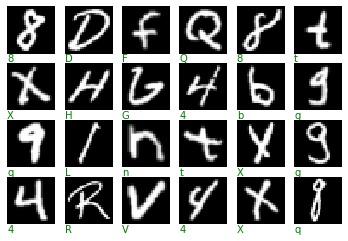

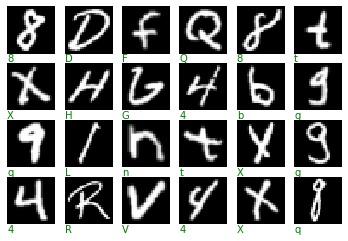

In [45]:
# the following is the correct mapping
mapping = np.loadtxt(f"{root}/emnist-balanced-mapping.txt",dtype=int, usecols=(1), unpack=True)

plot_some_samples(x_train, y_train, label_mapping=mapping)

# Exercise 2: Simple Perceptrons (10 pts) 

Define and fit a model without a hidden layer (since we will use multi-layer models later in this project, you can define a general constructor function for models with an arbitrary number of fully connected hidden layers already at this point). Use the [`tensorflow.keras.Sequential`](https://www.tensorflow.org/api_docs/python/tf/keras/Sequential) class imported as `Sequential` in the above dependencies.

1. Use the softmax activation for the output layer.
2. Use the 'categorical_crossentropy' loss.
3. Add the accuracy metric to the metrics.
4. Choose stochastic gradient descent (SGD, already implemented in Keras) as the optimizer.
5. Choose a minibatch size of 128.
6. Visualise the network you created using the `summary()` method of the `tensorflow.keras.Sequential` class (6 pts for the constructor and fit functions satisfying points 1. - 6.).
7. Fit for as many epochs as needed to see no further decrease in the validation loss (1 pt).
8. Plot the output of the fitting procedure (a history object) using the function `plot_history` defined above (1 pt).
9. Repeat the fit of point 6. using the [Adam optimiser](https://arxiv.org/abs/1412.6980) (also already implemented in Keras) (1 pt).
10. Plot the new learning curves together with the ones of point 7 in a comparison plot (you can use the function `comparison_plot` defined above) and answer to the question in the markdown box below (1 pt).

Hints:
* Read the ([tensorflow.keras](https://www.tensorflow.org/api_docs/python/tf/keras/) or) [keras docs](https://keras.io), in particular [Getting started with the Keras Sequential model](https://keras.io/getting-started/sequential-model-guide/).
* Have a look at the keras [examples](https://github.com/keras-team/keras/tree/master/examples) to gain inspiration for network architectures.  
**Important:** Since we are using tensorflow 2 you have to import Keras (functions) via tensorflow (see Introduction/Prerequisites).



In [46]:
y_train.shape

(112800, 47)

In [0]:
num_classes = 47 # number of labels/classes in the balanced emnist dataset

In [48]:
# define models
# you can create a generic constructor function for MLPs
model_simple = tf.keras.Sequential([
    Flatten(input_shape=(28,28,1)),
    Dense(num_classes, activation="softmax")
])
model_simple.compile(optimizer="sgd", loss="categorical_crossentropy", metrics=["accuracy"])
model_simple.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_2 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 47)                36895     
Total params: 36,895
Trainable params: 36,895
Non-trainable params: 0
_________________________________________________________________


In [0]:
checkpoint_path_model_simple = f'{root}/checkpoints_simple/cp.ckpt'
logdir_simple = f"{root}/logs_simple/model_simple" + datetime.now().strftime("%Y%m%d-%H%M%S")

In [91]:
# ONLY RUN THIS CELL THE FIRST TIME I.E WHEN WEIGHTS AND LOGS HAVE NOT BEEN SAVED
# create and fit your model
# save model 
cp_callback_simple = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_model_simple,
                                                 save_weights_only=True,
                                                 verbose=1)
 
tensorboard_callback_simple = tf.keras.callbacks.TensorBoard(log_dir=logdir_simple)

# Fit for as many epochs as needed to see no further decrease in the validation loss (1 pt).
es_callback = tf.keras.callbacks.EarlyStopping(
        # Stop training when `val_loss` is no longer improving
        monitor='val_loss',
        # "no longer improving" being defined as "no better than 1e-2 less"
        min_delta=1e-2,
        # "no longer improving" being further defined as "for at least 2 epochs"
        patience=2,
        verbose=1) # => the params are courtesy to https://www.tensorflow.org/guide/keras/train_and_evaluate


history_simple = trackhistory((x_train, y_train), (x_test, y_test), 
                         do_print = True, evaluate = 'after_epoch')

model_simple.fit(x_train, y_train, batch_size = 128, epochs = 50, verbose = 1, 
          validation_data = (x_test, y_test), callbacks = [history_simple, es_callback, 
                                                           cp_callback_simple, tensorboard_callback_simple], 
                 use_multiprocessing=True,
         workers=4) # use callback of early stopping to run more epochs

Epoch 1/50
871/882 [============================>.] - ETA: 0s - loss: 3.0620 - accuracy: 0.3149
train loss: 2.453766107559204, train acc: 0.48475176095962524

val loss: 2.458956718444824, val acc: 0.47904255986213684



Epoch 00001: saving model to /content/drive/My Drive/Colab Notebooks/checkpoints_simple/cp.ckpt
882/882 [==============================] - 6s 7ms/step - loss: 3.0547 - accuracy: 0.3169 - val_loss: 2.4590 - val_accuracy: 0.4790
Epoch 2/50
872/882 [============================>.] - ETA: 0s - loss: 2.1827 - accuracy: 0.5181
train loss: 1.9784456491470337, train acc: 0.5433067083358765

val loss: 1.9872549772262573, val acc: 0.5386702418327332



Epoch 00002: saving model to /content/drive/My Drive/Colab Notebooks/checkpoints_simple/cp.ckpt
882/882 [==============================] - 6s 7ms/step - loss: 2.1803 - accuracy: 0.5183 - val_loss: 1.9873 - val_accuracy: 0.5387
Epoch 3/50
863/882 [============================>.] - ETA: 0s - loss: 1.8664 - accuracy: 0.5546
train loss

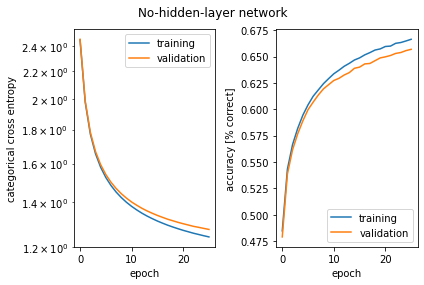

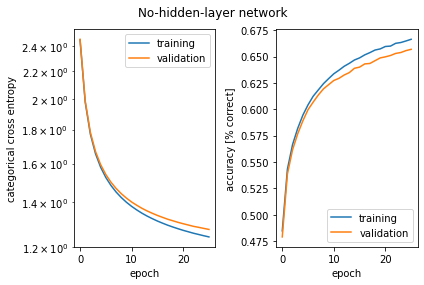

In [92]:
# DON'T RERUN
plot_history(history_simple, "No-hidden-layer network")

In [21]:
%tensorboard --logdir "{root}/logs_simple"

<IPython.core.display.Javascript object>

In [50]:
# Repeat the fit of point 6. using the Adam optimiser (also already implemented in Keras) (1 pt).
# Plot the new learning curves together with the ones of point 7 in a comparison plot 
# (you can use the function comparison_plot defined above) and answer to the question in the markdown box 
# below (1 pt).

model_simple.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
model_simple.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_2 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 47)                36895     
Total params: 36,895
Trainable params: 36,895
Non-trainable params: 0
_________________________________________________________________


In [0]:
checkpoint_path_model_simple_adam = f'{root}/checkpoints_simple_adam/cp.ckpt'
logdir_adam = f"{root}/logs_simple_adam/model_simple_adam" + datetime.now().strftime("%Y%m%d-%H%M%S")

In [52]:
# RUN THIS IF WEIGHTS HAVE BEEN PREVIOUSLY SAVED
checkpoint_dir = os.path.dirname(checkpoint_path_model_simple_adam)
latest = tf.train.latest_checkpoint(checkpoint_dir)
model_simple.load_weights(latest)

In [95]:
# ONLY RUN THIS CELL THE FIRST TIME I.E WHEN WEIGHTS AND LOGS HAVE NOT BEEN SAVED
# Fit for as many epochs as needed to see no further decrease in the validation loss (1 pt).

cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_model_simple_adam,
                                                 save_weights_only=True,
                                                 verbose=1)
 
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir_adam)

es_callback = tf.keras.callbacks.EarlyStopping(
        # Stop training when `val_loss` is no longer improving
        monitor='val_loss',
        # "no longer improving" being defined as "no better than 1e-2 less"
        min_delta=1e-2,
        # "no longer improving" being further defined as "for at least 2 epochs"
        patience=2,
        verbose=1) 

history_adam = trackhistory((x_train, y_train), (x_test, y_test), 
                         do_print = True, evaluate = 'after_epoch')
model_simple.fit(x_train, y_train, batch_size = 128, epochs = 50, verbose = 1, 
          validation_data = (x_test, y_test), callbacks = [history_adam, es_callback, cp_callback, tensorboard_callback], 
                 use_multiprocessing=True, workers=8) # use callback of early stopping to run more epochs

Epoch 1/50
871/882 [============================>.] - ETA: 0s - loss: 1.2075 - accuracy: 0.6715
train loss: 1.1543731689453125, train acc: 0.6854521036148071

val loss: 1.2038018703460693, val acc: 0.6732978820800781



Epoch 00001: saving model to /content/drive/My Drive/Colab Notebooks/checkpoints_simple_adam/cp.ckpt
882/882 [==============================] - 6s 7ms/step - loss: 1.2073 - accuracy: 0.6716 - val_loss: 1.2038 - val_accuracy: 0.6733
Epoch 2/50
873/882 [============================>.] - ETA: 0s - loss: 1.1539 - accuracy: 0.6858
train loss: 1.1251659393310547, train acc: 0.694033682346344

val loss: 1.1827566623687744, val acc: 0.6823404431343079



Epoch 00002: saving model to /content/drive/My Drive/Colab Notebooks/checkpoints_simple_adam/cp.ckpt
882/882 [==============================] - 6s 7ms/step - loss: 1.1539 - accuracy: 0.6858 - val_loss: 1.1828 - val_accuracy: 0.6823
Epoch 3/50
880/882 [============================>.] - ETA: 0s - loss: 1.1300 - accuracy: 0.6927
t

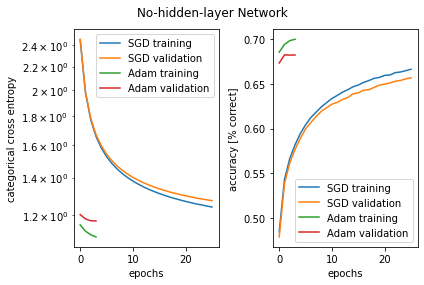

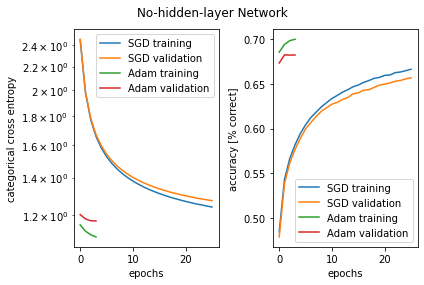

In [96]:
# DON'T RERUN
# comparison plot
comparison_plot(history_simple, history_adam, "SGD", "Adam", "No-hidden-layer Network")

In [24]:
%tensorboard --logdir "{root}/logs_simple_adam"

<IPython.core.display.Javascript object>

**Question**: How do the learning curves change when replacing the SGD optimiser by the Adam optimiser? Please answer with one full sentence.

(double click this markdown cell to edit).

**Answer**: The Adam optimiser made training significantly faster and with better accuracy than the SGD optimiser.

# Exercise 3: Multi-layer Perceptrons (MLP), overfitting and dropout (10 pts)  

In this exercise we will use a Multi-layer Perceptron with multiple, fully-connected (dense), hidden layers to explore overfitting in neural networks. 

1. Create a model with 2 or 3 fully-connected, hidden layers with 500 hidden neurons each. Hidden layers should have a `relu` nonlinearity and the last layer a `softmax` nonlinearity. Use the `categorical_crossentropy` loss. Include the option of having a [dropout layer](https://arxiv.org/abs/1207.0580) after each hidden layer in your constructor function (2 pts).
2. Use the Adam optimiser, train the model for at least 10 epochs and plot the learning curves. No dropout should be used for this simulation (2 pts).
3. Answer question 1. in the below markdown box
4. Include dropout layers into your MLP and experiment with different dropout rates. Once you have obtained learning curves that differ qualitatively from the ones in point 2., plot all of them together in a comparison plot (2 pts).
5. Discuss the effect of dropout by answering question 2 in the below markdown box (2 pts).


**Question 1** What is the qualitative difference between training and validation learning curve? How can you explain this behaviour? (2 sentences max.)

**Answer** 

**Question 2** How are the dropout layers changing the learning curves? How can we understand this influence of these layers? (2 sentences max.)

**Answer** 

# Exercise 4: Convolutional Neural Networks (CNN) (10 pts)

Convolutional neural networks have an inductive bias that is well adapted to image classification.

1. Design a convolutional neural network and play with different architectures and parameters. Use at least 2 to 3 convolutional layers and one fully-connected layer between convolutional layers and output layer. You may want to use dropout for the fully-connected layers. Use a softmax nonlinearity for the output and categorical crossentropy loss as before. Your CNN model should significantly outperform the above MLPs for reasonable hidden layer sizes. Please visualise your best performing CNN using the `summary` method. Hint: You may get valuable inspiration from the keras [examples](https://github.com/keras-team/keras/tree/master/examples) (4 pts).
2. Plot the learning curves of the best convolutional neural network you found for the EMNIST dataset (2 pts).
3. Answer to the questions in the markdown box below (4 pts).


In [53]:
model_conv1 = tf.keras.Sequential([
#     Flatten(),
    Conv2D(32, input_shape=(28,28,1), kernel_size=(3, 3), activation='relu'),
    Conv2D(64, (3, 3), activation='relu'),
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.2),
    Dense(num_classes, activation="softmax")
])

model_conv1.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
model_conv1.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
flatten_3 (Flatten)          (None, 36864)             0         
_________________________________________________________________
dense_4 (Dense)              (None, 128)               4718720   
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 47)                6063      
Total params: 4,743,599
Trainable params: 4,743,599
Non-trainable params: 0
____________________________________________

In [0]:
checkpoint_path_model_conv1 = f'{root}/checkpoints_conv1/cp.ckpt'
logdir_conv1 = f"{root}/logs_conv1/model_conv1" + datetime.now().strftime("%Y%m%d-%H%M%S")

In [55]:
# RUN THIS IF WEIGHTS HAVE BEEN PREVIOUSLY SAVED
checkpoint_dir = os.path.dirname(checkpoint_path_model_conv1)
latest = tf.train.latest_checkpoint(checkpoint_dir)
model_conv1.load_weights(latest)

In [100]:
# ONLY RUN THIS CELL THE FIRST TIME I.E WHEN WEIGHTS AND LOGS HAVE NOT BEEN SAVED
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_model_conv1,
                                                 save_weights_only=True,
                                                 verbose=1)
 
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir_conv1)

# early stopping callback
es_callback = tf.keras.callbacks.EarlyStopping(
        # Stop training when `val_loss` is no longer improving
        monitor='val_loss',
        # "no longer improving" being defined as "no better than 1e-2 less"
        min_delta=1e-2,
        # "no longer improving" being further defined as "for at least 2 epochs"
        patience=2,
        verbose=1
) 


# history callback
history_conv1 = trackhistory((x_train, y_train), (x_test, y_test), 
                         do_print = True, evaluate = 'after_epoch')

model_conv1.fit(x_train, y_train, batch_size = 128, epochs = 8, verbose = 1, 
          validation_data = (x_test, y_test), 
               callbacks = [history_conv1, es_callback, cp_callback, tensorboard_callback], 
               use_multiprocessing=True, workers=8) 

Epoch 1/8
882/882 [==============================] - ETA: 0s - loss: 0.8205 - accuracy: 0.7494
train loss: 0.39288511872291565, train acc: 0.8663032054901123

val loss: 0.4680735170841217, val acc: 0.8450531959533691



Epoch 00001: saving model to /content/drive/My Drive/Colab Notebooks/checkpoints_conv1/cp.ckpt
882/882 [==============================] - 412s 467ms/step - loss: 0.8205 - accuracy: 0.7494 - val_loss: 0.4681 - val_accuracy: 0.8451
Epoch 2/8
882/882 [==============================] - ETA: 0s - loss: 0.4571 - accuracy: 0.8435
train loss: 0.3153938353061676, train acc: 0.8884042501449585

val loss: 0.4193646311759949, val acc: 0.8567021489143372



Epoch 00002: saving model to /content/drive/My Drive/Colab Notebooks/checkpoints_conv1/cp.ckpt
882/882 [==============================] - 414s 470ms/step - loss: 0.4571 - accuracy: 0.8435 - val_loss: 0.4194 - val_accuracy: 0.8567
Epoch 3/8
882/882 [==============================] - ETA: 0s - loss: 0.3806 - accuracy: 0.8646
train 

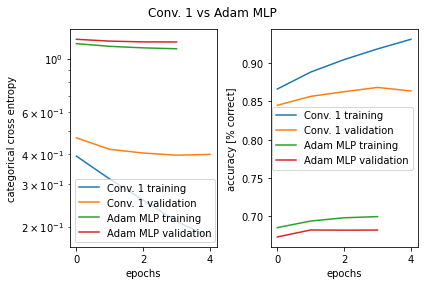

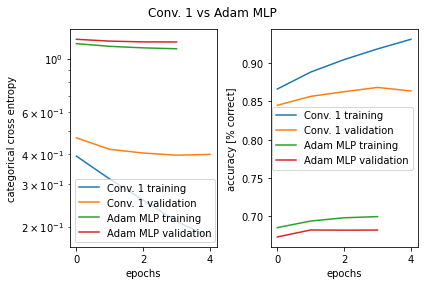

In [101]:
# DON'T RERUN
comparison_plot(history_conv1, history_adam, "Conv. 1", "Adam MLP", "Conv. 1 vs Adam MLP")

In [27]:
%tensorboard --logdir "{root}/logs_conv1"

<IPython.core.display.Javascript object>

In [28]:
model_conv2 = tf.keras.Sequential([
#     Flatten(),
    Conv2D(32, input_shape=(28,28,1), kernel_size=(3, 3), activation='relu'),
    Conv2D(64, (3,3), activation="relu"),
    Conv2D(128, (3, 3), activation="relu"),
    Flatten(),
    Dense(64, activation="relu"),
    Dropout(0.2),
    Dense(32, activation="relu"),
    Dropout(0.2),
    Dense(num_classes, activation="softmax")
])

model_conv2.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
model_conv2.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 22, 22, 128)       73856     
_________________________________________________________________
flatten_2 (Flatten)          (None, 61952)             0         
_________________________________________________________________
dense_3 (Dense)              (None, 64)                3964992   
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 32)               

In [0]:
checkpoint_path_model_conv2 = f'{root}/checkpoints/model_conv2'
logdir_conv2 = f"{root}/logs_conv2/model_conv2" + datetime.now().strftime("%Y%m%d-%H%M%S")

In [104]:
# ONLY RUN THIS CELL THE FIRST TIME I.E WHEN WEIGHTS AND LOGS HAVE NOT BEEN SAVED
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_model_conv2,
                                                 save_weights_only=True,
                                                 verbose=1)
 
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir_conv2)

es_callback = tf.keras.callbacks.EarlyStopping(
        # Stop training when `val_loss` is no longer improving
        monitor='val_loss',
        # "no longer improving" being defined as "no better than 1e-2 less"
        min_delta=1e-2,
        # "no longer improving" being further defined as "for at least 2 epochs"
        patience=2,
        verbose=1
) 


# history callback
history_conv2 = trackhistory((x_train, y_train), (x_test, y_test), 
                         do_print = True, evaluate = 'after_epoch')

model_conv2.fit(x_train, y_train, batch_size = 128, epochs = 8, verbose = 1, 
          validation_data = (x_test, y_test), 
               callbacks = [history_conv2, es_callback, cp_callback, tensorboard_callback], 
               use_multiprocessing=True, workers=8) 

Epoch 1/8
882/882 [==============================] - ETA: 0s - loss: 1.4076 - accuracy: 0.5895
train loss: 0.4863572120666504, train acc: 0.838891863822937

val loss: 0.5472328066825867, val acc: 0.8256914615631104



Epoch 00001: saving model to /content/drive/My Drive/Colab Notebooks/checkpoints/model_conv2
882/882 [==============================] - 1039s 1s/step - loss: 1.4076 - accuracy: 0.5895 - val_loss: 0.5472 - val_accuracy: 0.8257
Epoch 2/8
882/882 [==============================] - ETA: 0s - loss: 0.7410 - accuracy: 0.7587
train loss: 0.38699233531951904, train acc: 0.8662322759628296

val loss: 0.46807965636253357, val acc: 0.8470212817192078



Epoch 00002: saving model to /content/drive/My Drive/Colab Notebooks/checkpoints/model_conv2
882/882 [==============================] - 1049s 1s/step - loss: 0.7410 - accuracy: 0.7587 - val_loss: 0.4681 - val_accuracy: 0.8470
Epoch 3/8
882/882 [==============================] - ETA: 0s - loss: 0.6139 - accuracy: 0.7967
train loss: 0.

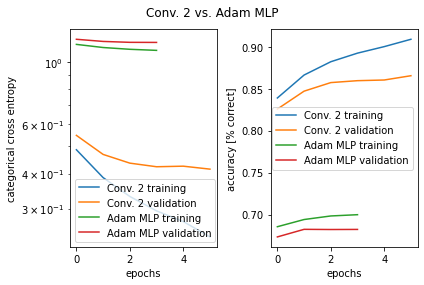

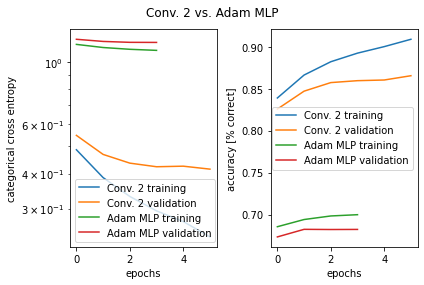

In [105]:
# DON'T RERUN
comparison_plot(history_conv2, history_adam, "Conv. 2", "Adam MLP", "Conv. 2 vs. Adam MLP")

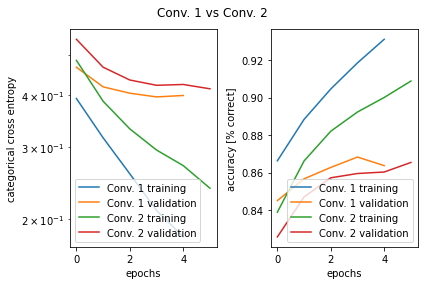

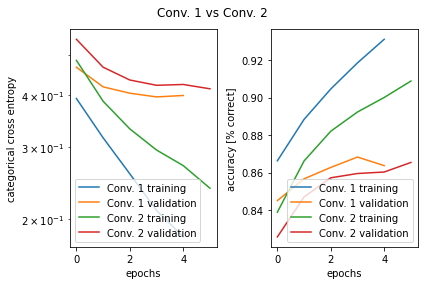

In [106]:
# DON'T RERUN
comparison_plot(history_conv1, history_conv2, "Conv. 1", "Conv. 2", "Conv. 1 vs Conv. 2")

***The plot above showed that model Conv.1 not only took a shorter time to train but also performed better in terms of accuracy.***

**Question 1** How does the CNN performance compare to the so far best performing MLP model for the EMNIST data set? (1 sentence max.)

**Answer** The CNN networks gave significant improvement from the ***best*** performing MLP, which was found to be the Adam-optimiser-MLP model.

**Question 2** Seeing an MLP as a general function approximator, the convolutional architecture is actually a restriction to that generality. How can you explain that CNNs are still performing better on image classification tasks? (2 sentences max.)

**Answer** This is because they have the right explicit "inductive" bias. Convolving the data proves to be a great variation of data augmentation for image data through two intuitions: independence to translation and usefulness of local feature detectors.

**Question 3** Standard CNNs are computationally heavy models compared to standard MLPs and training a CNN for one epoch could take e.g. 5 times longer than for an MLP (not taking GPUs into account). That means that in a CNN there are many more operations (like multiplications and additions) taking place per input than in an MLP. However, you might notice that your CNN has a comparable or even smaller number of trainable parameters than the MLPs before. How is this possible? (2 sentences max.)

**Answer** [...]

# Part 2: Feature visualisation

In this second part of the project we use standard and non-standard ways of visualising learned features in deep neural networks. We will refer to these 'learned features' or 'prefered stimuli' of a given neuron in the network as '[receptive fields](https://en.wikipedia.org/wiki/Receptive_field)' - a term borrowed from neuroscience.

**Remark:** For the following exercies it will be useful to get an overview over the network structure of the models such as layer names. For this you can use either the `model.summary()` method or layer dictionaries: `layer_dict = dict([(layer.name, layer) for layer in model.layers])`

# Exercise 5: Plotting the weights (10 pts)

The easist and most straighforward way to investigate learned features in an artificial neural network is to directly look at the learned incoming weights to a given neuron. For the first layer's weights we can actually display them as an image since they 'live' in the same space as the input - i.e. in the image space.

1. Find a way to access the weights of the first layer of a `Sequential` model and transform them into a numpy array. Hint: `get_layer()`, `_trainable_weights` (1 pt).
2. Write a function `plot_weights` that takes the extracted weights as a numpy array and plots the incoming weights of N^2 neurons in the first hidden layer in a NxN grid of `plt.imshow()` image plots. Make your function suitable for both fully-connected layers and convolutional layers (3 pt).
3. Plot the incoming weights for some (e.g. N = 5) neurons in the first (= only) layer of a simple perceptron (SP) (1 pt).
4. Do the same plotting as in point 3. for the first layer of your best MLP (1 pt).
5. Do the same plotting as in point 3. for the first layer of your CNN (1 pt).
6. Discuss what you observe by answering the question in the markdown box below (3 pt).


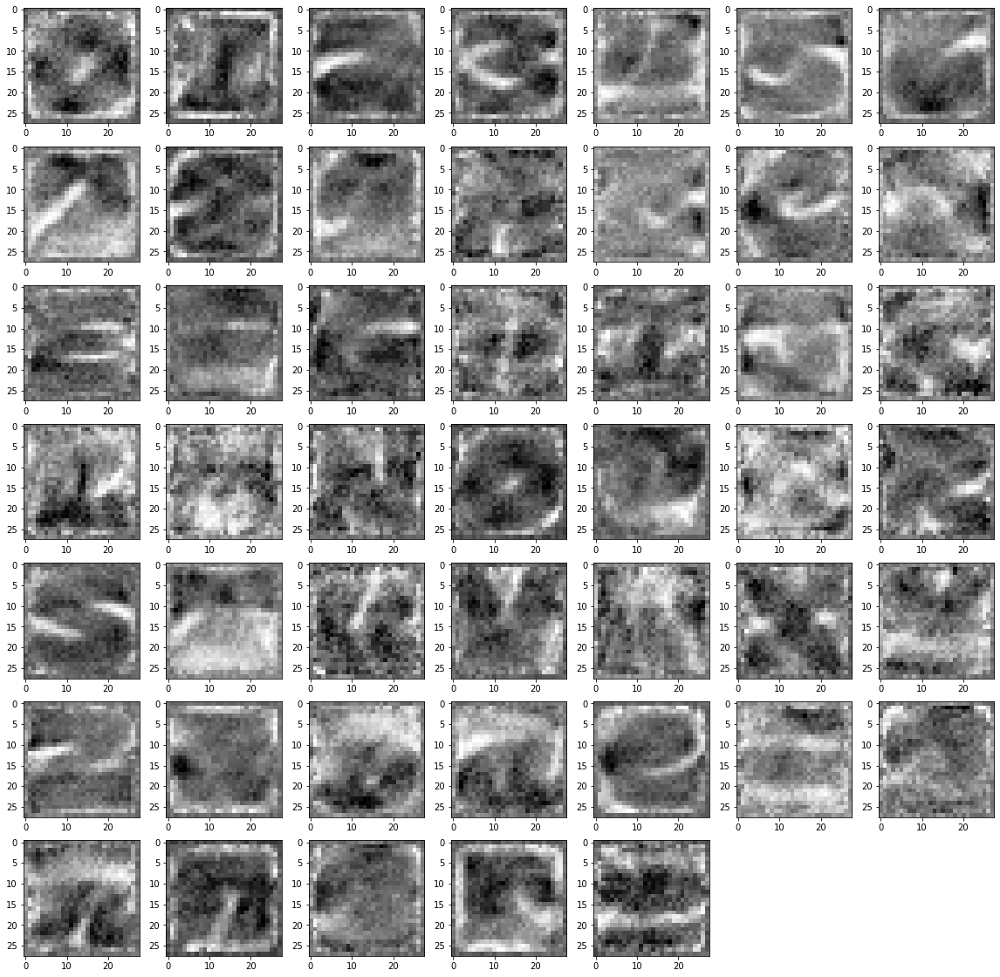

In [25]:
# Hien's try-out: Test/experiment with accessing weights of Sequential model:

weights, bias = model_simple.get_layer(index=1)._trainable_weights # 28x28 = 784 neurons, and we only care about the kernel weights

plt.figure(figsize=(20,20))

lines = 7
columns = 7
for i in range(weights.shape[1]):
  ax = plt.subplot(lines, columns, i+1)
  im = weights.numpy()[:, i].reshape((28,28))
  plt.imshow(im, cmap="Greys")
  plt.sca(ax)


In [0]:
def plot_weights(weights, N, ...):
    
    # ...
    
    return fig

SyntaxError: ignored

### Simple Perceptron

In [0]:
layer_id = ... # e.g. 'dense_1'. Can be read from the model.summary() or a layer dictionary


### Multi Layer Perceptron

### CNN

**Question 1** Describe the 'receptive fields' you obtained for the simple perceptron (SP). Can you explain their appearance given the fact that the corresponding neurons are the output neurons of this network? (2 sentences max.)

**Answer** 

**Question 2** Describe the 'receptive fields' you obtained for the MLP. How do they compare to the SP ones? (2 sentences max.)

**Answer** 

**Question 3** Explain the dimensions of the CNN filters. Can we interpret the learned features as for the SP or MLP?

**Answer** 

# Exercise 6: Maximaly activating patch/image method (10 pts)

Another easy way to get an intuition what a specific neuron codes for is to look at the input images that maximise its activity the most. To this end you should:

1. Complete the function `get_mean_filter_response` to extract the (spatially averaged) responses of a neuron to every input image in the test set (to save some computation time) (2 pts).
2. For your CNN model, extract the indices of the N^2 input images (for N = 5) that caused the highest response in one arbitrary unit in an arbitrary layer (1 pt).
3. Plot the corresponding N^2 input images in a NxN grid (using `plt.imshow()` for every image in the grid) (1 pt).
4. Do this plot for several units (e.g. 3 different ones) in the first (conv.) layer, a middle layer and the last trainable (fully-connected) layer of your model (3 pts).
5. Describe what you observed by anwering the questions in the below markdown box (3 pts).


In [26]:
# Hien's test
test_model = tf.keras.Model(inputs=model_simple.inputs[0], outputs=model_simple.get_layer(index=1).output)
test_output = test_model(x_test).numpy()
#tf.math.top_k(tf.math.reduce_mean(test_output, [1,2]))
#tf.math.top_k(test_model(x_test).numpy())
#test_output.shape

test_model2 = tf.keras.Model(inputs=model_conv1.inputs[0], outputs=model_conv1.get_layer(index=0).output)
test_output2 = test_model2(x_test).numpy()
#tf.math.top_k(test_output2[:, :, :, 31])

tf.reduce_mean(test_output2[:, :, :, 31], [1,2]), test_output[:, 46].shape

(<tf.Tensor: shape=(18800,), dtype=float32, numpy=
 array([0.07886662, 0.04757237, 0.01924875, ..., 0.04759131, 0.04374615,
        0.02848094], dtype=float32)>, (18800,))

In [27]:
model_conv1.inputs[0]

<tf.Tensor 'conv2d_input:0' shape=(None, 28, 28, 1) dtype=float32>

In [0]:
def get_mean_filter_response(model, data, layer_id, filter_id):
    # Define a new model which outputs the activity of a specific layer
    aux_model = tf.keras.Model(inputs=model.inputs[0], outputs=model.get_layer(index=layer_id).output)
    inter_layer_output = aux_model(data).numpy()

    # fully connected layer case: mean_responses are simply a slice of inter_layer_output for the unit 'filter_id'
    if len(inter_layer_output.shape) == 2:
        mean_responses = inter_layer_output[:, filter_id]
    # conv layer case: take slice for unit 'filter_id' and average (np.mean) over the two spatial dimensions
    elif len(inter_layer_output.shape) == 4:
        mean_responses = tf.reduce_mean(inter_layer_output[:, :, :, filter_id], [1,2])
    
    return mean_responses


layer_id = 0 # e.g. 'conv2d'. Can be read from the model.summary() or a layer dictionary
filter_id = 10 # e.g. 10
    
mean_responses = get_mean_filter_response(model_conv1, x_test, layer_id, filter_id)

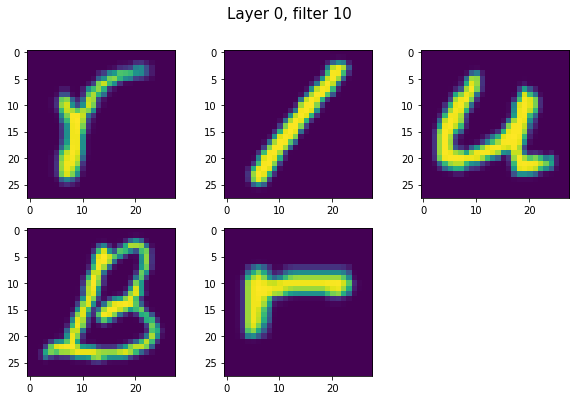

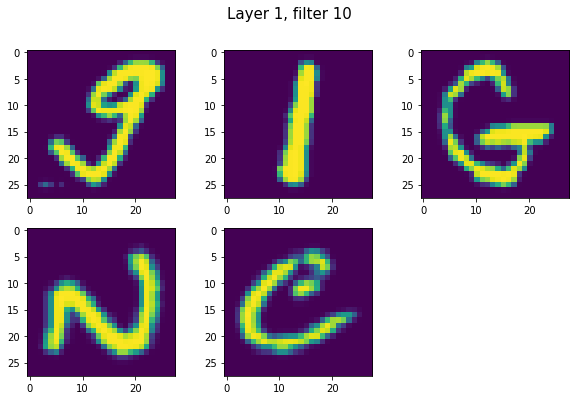

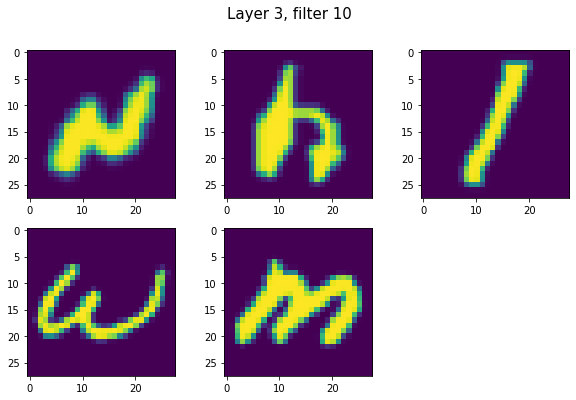

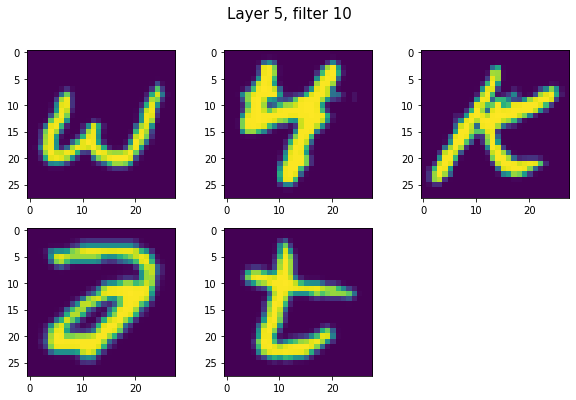

In [80]:
# plotting

#For your CNN model, extract the indices of the N^2 input images (for N = 5)
# that caused the highest response in one arbitrary unit in an arbitrary layer (1 pt).
N = 5 # extract the indices of 
filter_id = 10 # e.g. 10

for layer_id in (0, 1, 3, 5):
  mean_responses = get_mean_filter_response(model_conv1, x_test, layer_id, filter_id)
  _, indices = tf.math.top_k(mean_responses, k=N)
  images = x_train[indices.numpy(), :, :, :]
  lines = 2
  columns = 3
  fig = plt.figure(figsize=(10,6))
  fig.suptitle(f"Layer {layer_id}, filter {filter_id}", size=15)
  # plt.subplots_adjust(bottom = 0.0)
  plt.tight_layout()
  for i in range(N):
    img = images[i, :, :, :].reshape((28,28))
    plt.subplot(lines, columns, i + 1)
    plt.imshow(img)

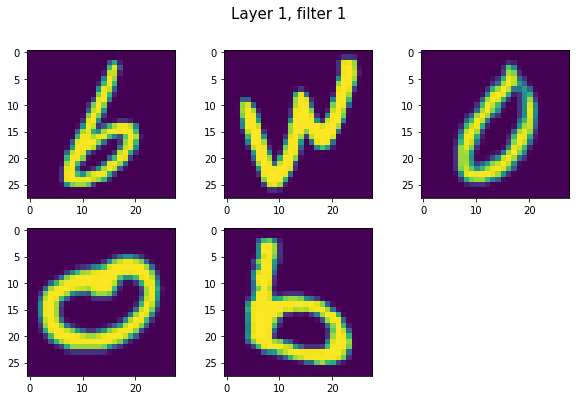

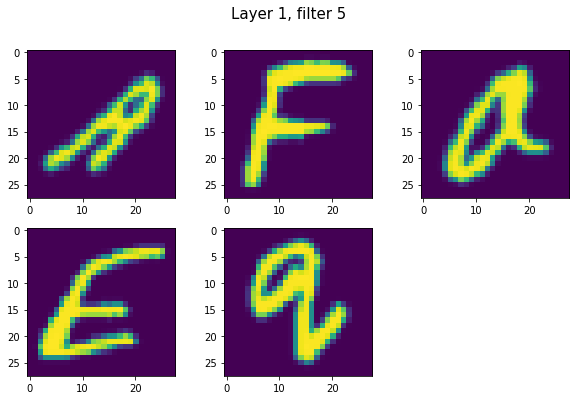

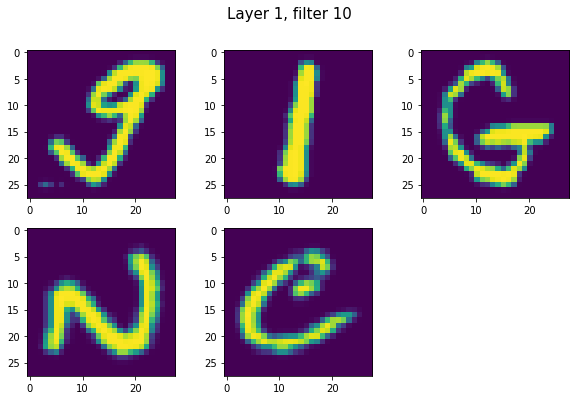

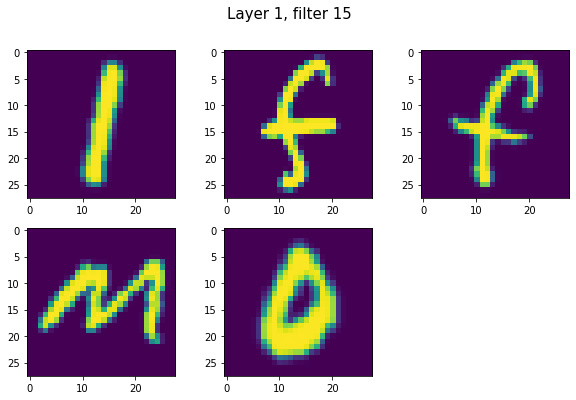

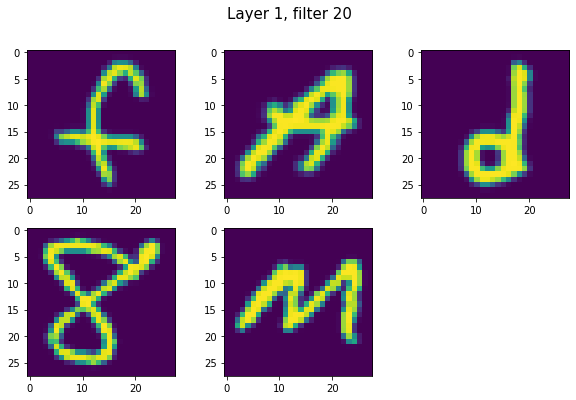

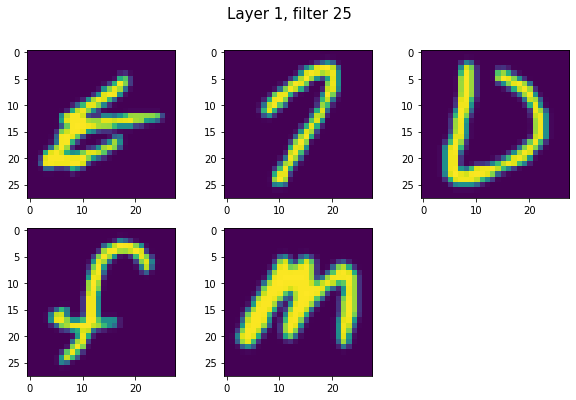

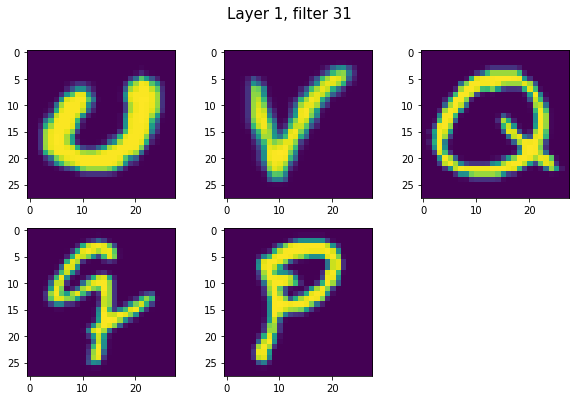

In [82]:
layer_id = 1
for filter_id in (1, 5, 10, 15, 20, 25, 31):
  mean_responses = get_mean_filter_response(model_conv1, x_test, layer_id, filter_id)
  _, indices = tf.math.top_k(mean_responses, k=N)
  images = x_train[indices.numpy(), :, :, :]
  lines = 2
  columns = 3
  fig = plt.figure(figsize=(10,6))
  fig.suptitle(f"Layer {layer_id}, filter {filter_id}", size=15)
  # plt.subplots_adjust(bottom = 0.0)
  plt.tight_layout()
  for i in range(N):
    img = images[i, :, :, :].reshape((28,28))
    plt.subplot(lines, columns, i + 1)
    plt.imshow(img)

Looking at the input images that maximize activity in specific units, what can you say about the features they code for in the case of (1 sentence max. for each question):

**Question 1** the first (convolutional) layer?  
**Anwer** 

**Question 2** an intermediate layer?  
**Answer**  

**Question 3** the last trainable (fully-connected) layer?  
**Answer** 

# Exercise 7: Reverse Correlation (8 pts)

In this exercise we use a method known from neuroscience called '[Reverse Correlation](https://en.wikipedia.org/wiki/Spike-triggered_average)' or 'Spike-triggered average' to visualise linear learned filters - or '[receptive fields](https://en.wikipedia.org/wiki/Receptive_field)', as a neuroscientis would say. The idea is to correlate every input image ('trigger') with its response ('spike') in a certain unit and then average over whole dataset.

1. Complete the function `get_rev_cor` that computes the reverse correlation of a unit as described above. Use the function `get_mean_filter_response` from above to get the response of a unit for all input images in the test set (1 pt).
2. Plot the reverse correlation of one or two units in the first layer of the CNN model as an image (1 pt).
3. Plot the reverse correlation of one or two units in a middle layer of the CNN model as an image (1 pt).
4. Plot the reverse correlation of one or two output units in the last layer of the CNN model as an image (1 pt).
5. Plot the mean image of the test set, i.e. a reverse correlation assuming a unit responds with the exact same value to all images (1 pt).
6. Discuss your results by answering the question in the markdown box below (3 pt).


In [0]:
def get_rev_cor(model, data, layer_id, filter_id):
    # get (mean) responses for all images in 'data'
    mean_responses = ...
    # product with data
    rev_cor_product = np.transpose(np.multiply(np.transpose(x_test, (3, 1, 2, 0)), mean_responses), (3, 1, 2, 0))
    # average rev_cor_product over data dimension to get reverse correlation
    rev_cor = ...
    
    return rev_cor


In [0]:
# Call 'get_rev_cor' and plotting

**Question 1** Why does reverse correlation NOT give an insightful image for lower and middle layers? (1 sentence max.)

**Answer** 

**Question 2** How is the average image of the test set related to these unsatisfying reverse correlation images? (1 sentence max.)

**Answer** 

**Question 3** Interpret the reverse correlation image for the output neurons. Why is it meaningful and would this also work for harder data sets where objects of the same class occur e.g. at different positions in the image? (2 sentences max.)

**Anwer** 

# Exercise 8: Gradient method (10 pts)

After the 'standard methods' above we now look at a more elaborate method for visualising features of deep neural networks that can lead to such cool images as shown in the introduction of this notebook.  

The basic idea is to use the power of backpropagation to look for a 'maximally activating image' that activiates a certain unit as much as possible: We define the activity of a unit as the loss and then iteratively create an image by updating proportionally to the gradient of this loss with respect to the pixels.  

This idea was published first in [1] and the version we will implement (especially the simple, yet effective gradient normalisation trick) is inspired by the tutorial in [2] (**Careful:** This tutorial is using Keras under Tensorflow 1, so do not copy paste their code here since it will not work with tensorflow 2!).

1. Read the basics [1, 2] about the gradient method and understand the provided functions below. Then answer to the questions in the markdown box below (2 pts).
2. Complete the function `get_max_act_stim` using the provided functions (2 pts).
3. Calculate the 'maximally activating image' for one or more arbitrary units in three different layers (first, middle, last) of your CNN model and plot the results as images. Some units might not respond to any input image and should be ignored. You can use the `post_process_image` function at this point but results should not change dramatically for CNNs trained on EMNIST (3 pts).
5. Discuss the results by answering the question in the markdown box below (1 pts).
4. Now that we are experts in this method we step to bigger networks with richer features. Download a big CNN model, e.g. ResNet50, which was pretrained on ImageNet from the [Keras applications webpage](https://www.tensorflow.org/api_docs/python/tf/keras/applications) using `from tensorflow.keras import applications`. In case you want to save disk space, make sure you only download the convolutional/pooling layers of the model since the fully-connected layers can be quite huge in terms of memory. Plot the resulting images for at least three different units in different layers (use the `post_process_image` function to obtain nice plots with `plt.imshow()`) (2 pts).

[1] D. Erhan, Y. Bengio, A. Courville, and P. Vincent. Visualizing higher-layer features of a deep network. Technical Report 1341, University of Montreal, Jun 2009. (https://pdfs.semanticscholar.org/65d9/94fb778a8d9e0f632659fb33a082949a50d3.pdf)

[2] https://blog.keras.io/how-convolutional-neural-networks-see-the-world.html


In [0]:
from tensorflow.keras import backend as K

def get_image_seed(aux_model, img_size = 224):
    # if input image size can be chosen (e.g. vgg16 without top)
    if aux_model.inputs[0].shape[1] == None: 
        return tf.Variable(np.float32(np.random.random((1, img_size, img_size, aux_model.input[0].shape[-1]))))
    # if the model has fixed input image size
    else:
        return tf.Variable(np.float32(np.random.random((1,) + aux_model.input[0].shape)))

def get_image_update_step(aux_model, filter_id, input_img, stepsize = 1):
    def _getgrads(aux_model, input_img):
        with tf.GradientTape() as tape:
            inter_layer_output = aux_model(input_img)
            if len(inter_layer_output.shape) == 2: # FC case
                loss = inter_layer_output[:, filter_id]
            elif len(inter_layer_output.shape) == 4: # conv layer case: spatial average
                loss = K.mean(inter_layer_output[:, :, :, filter_id])    
        # loss is now defined as output of unit 'filter_id'
        # take gradient of loss w.r.t. the input image
        return tape.gradient(loss, input_img)[0]
    
    # calulate gradient
    grads = _getgrads(aux_model, input_img)
    # normalization trick: we normalize the gradient as a regularisation
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)     
    return grads * stepsize

def get_max_act_stim(model, layer_id, filter_id, n_steps = 25):
    aux_model = tf.keras.Model(inputs=model.inputs[0], outputs=model.get_layer(*layer_id).output)
    # get an image seed
    input_img = get_image_seed(aux_model)

    i = 0
    n_resets = 0
    while i < n_steps :  # run gradient ascent for n_step steps
        # get image update using 'get_image_update_step'
        update = get_image_update_step(aux_model, filter_id, input_img)
        # this is needed to prevent endless loops
        if np.sum(update) == 0:
            print('loss and update is 0, restart with new image seed')
            input_img = get_image_seed(aux_model)
            i -= i
            n_resets += 1
            if n_resets > 100:
                raise Exception('reset image seed 100 times! exiting now')
        
        # convert update to numpy array, 
        # reshape it to the shape of 'input_img',
        # and add update to image using 'tensor.assign_add()''
        # print(input_img.shape)
        update = update.numpy().reshape(input_img.shape)
        input_img.assign_add(update)
        
        # normalise image after update
        # looks pretty much the same as normalising the gradient in 'get_image_update_step'
        input_img.assign(input_img / K.sqrt(K.mean(K.square(input_img))) + 1e-5 ) 
        i += 1
    
    print('reseted image seed ' + str(n_resets) + ' times')
    return input_img

# this is needed for visualisation. It shifts the distribution and clips outliers
def post_process_image(x, n_of_stds = 5):
    std = np.std(x)
    x = np.clip(x, -n_of_stds * std, n_of_stds * std)
    x -= x.min()
    x /= x.max()
    return x

In [75]:
model_conv1.summary() # checkin'

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
flatten_3 (Flatten)          (None, 36864)             0         
_________________________________________________________________
dense_4 (Dense)              (None, 128)               4718720   
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 47)                6063      
Total params: 4,743,599
Trainable params: 4,743,599
Non-trainable params: 0
____________________________________________

reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times


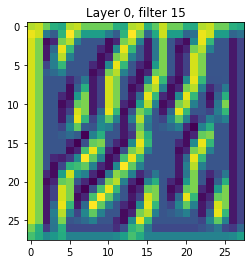

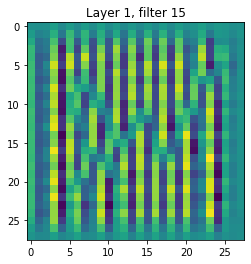

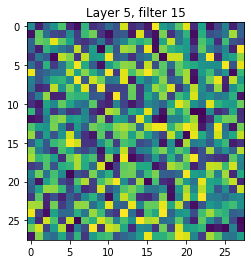

In [95]:
# apply your function 'get_max_act_stim' to your CNN and plot the results...
# Calculate the 'maximally activating image' for one or more arbitrary units in three different layers (first, middle, last) of your CNN
# model and plot the results as images. Some units might not respond to any input image
# and should be ignored. You can use the post_process_image function at this point but results should not change dramatically for 
# CNNs trained on EMNIST (3 pts)
filter_id = 15
for layer_id in (0, 1, 5):
  max_act = get_max_act_stim(model_conv1, (None, layer_id), filter_id)
  # plotting
  plt.figure()
  plt.title(f"Layer {layer_id}, filter {filter_id}")
  max_img = post_process_image(max_act.numpy()[0]).reshape((28,28))
  plt.imshow(max_img)

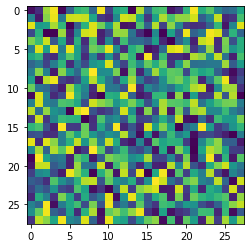

In [86]:
plt.imshow(get_image_seed(model_conv1).numpy()[0].reshape((28,28))) # original image

**Question 1** What is the image we start from for creating the maximally activating image and what are we updating at every step of the creation? (2 sentences max.)

**Answer** We start with a randomly created image that is compatible with the image dimensions of the model. At every step of creation, we are updating this image by applying an auto-encoder, calculating the gradient of the loss of this application step, and then adding this update (gradient times a step size) to the layer-output image.

**Question 2** Explain what the function `_getgrads()` implements. Gradients of what and with respect to what are taken? (2 sentences max.)

**Answer** `_getgrads()` takes the gradient of the loss of the output at each layer with regard to the input image. Here the loss is defined to be the layer's output itself.

**Question 3** Describe the qualitative change between the maximally optimising images we get for different layers. (2 sentences max.)

**Answer** At the different layers (first, middle, last), we can see that the image becomes more and more "complicated", following less of a defined pattern. This implies that the algorithms is learning better the image's variances at each layer.

### Big pretrained CNN Feature visualisation

In [87]:
# Now that we are experts in this method we step to bigger networks with richer features. Download a big CNN model, e.g. ResNet50, 
# which was pretrained on ImageNet from the Keras applications webpage using from tensorflow.keras import applications. In case you want 
# to save disk space, make sure you only download the convolutional/pooling layers of the model since the fully-connected layers can be
# quite huge in terms of memory. Plot the resulting images for at least three different units in different layers
# (use the post_process_image function to obtain nice plots with plt.imshow()) (2 pts).

from tensorflow.keras import applications

model_bigCNN = applications.ResNet50(include_top=False, weights='imagenet', input_tensor=None, input_shape=None,
    pooling="avg")

94773248/94765736 [==============================] - 1s 0us/step


In [91]:
len(model_bigCNN.layers), model_bigCNN.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, None, None, 6 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

(176, None)

reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times
reseted image seed 0 times


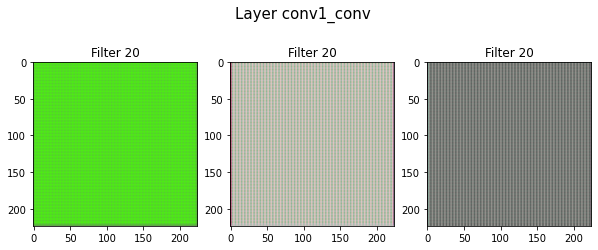

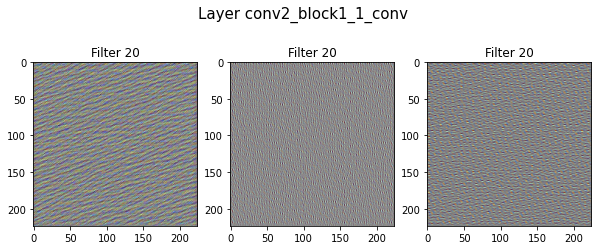

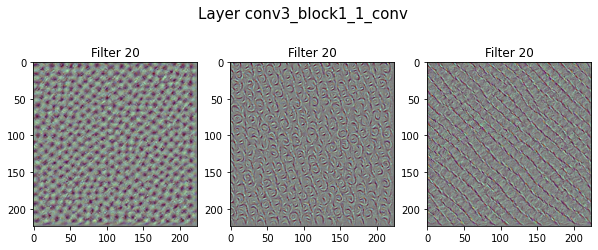

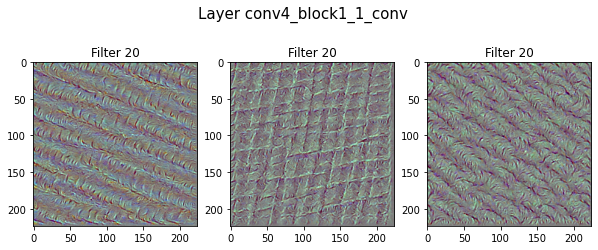

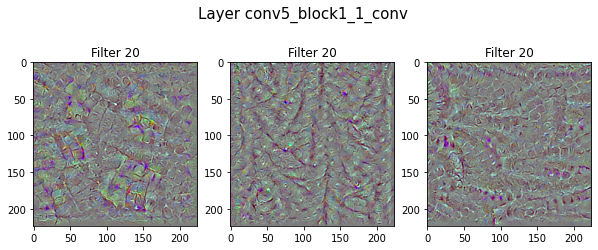

In [106]:
# apply your function 'get_max_act_stim' to the big pretrained CNN and plot the results...
# plot at least three different units at each selected layer

filter_ids = (1, 10, 20)
layer_ids = ("conv1_conv", "conv2_block1_1_conv", 
             "conv3_block1_1_conv", 
             "conv4_block1_1_conv",
             "conv5_block1_1_conv")

for layer_id in layer_ids:
  #print(layer_id)
  plt.figure(figsize=(10,4))
  plt.suptitle(f"Layer {layer_id}", size=15)
  # plt.subplots_adjust(bottom = 0.0)
  #plt.tight_layout()
  lines = 1
  columns = 3
  for i in range(len(filter_ids)):
    max_act = get_max_act_stim(model_bigCNN, (layer_id, None), filter_ids[i])
    #print(max_act)
    # plotting
    max_img = post_process_image(max_act.numpy()[0])
    ax = plt.subplot(lines, columns, i + 1)
    ax.set_title(f"Filter {filter_id}", size=12)
    plt.imshow(max_img)

## Follow up reading on the gradient method

In case you got interested in this type of visualisation methods for DNNs check out [this paper](https://arxiv.org/pdf/1506.06579.pdf) on extensions of the above gradient method with more sophisticated regularisation schemes. Have fun exploring ;)